### KdV with periodic boundary conditions

In this notebook we solve the equation $$u_t + uu_x + u_{xxx} = 0$$ with periodic boundary conditions. The domain for $x$ is $[0,2\pi]$. Periodic boundary conditions imply
$$u(0,t) = u(2\pi,t)\quad u_x(0,t) = u_x(2\pi, t)$$

Note this equation is Hamiltonian with the form $$ u_t = \partial_x \frac{\delta H}{\delta u}$$ where $$H = \int \left(\frac{u_x^2}{2} - \frac{u^3}{6}\right)dx$$ and hence $H$ is a conserved quantity. Indeed, there are an infinite number of conserved quantities, but we only check the numerical method to conserve $$ F =  \int \frac{u^4}{24} - \frac{uu_x^2}{2}+\frac{3u_{xx}^2}{10}dx,\quad P = \int \frac{u^2}{2}dx.$$
Note $$m = \int udx$$ is trivially conserved.


Lastly, note this equation has traveling wave solutions. For the periodic case, these solutions are of the form
$$ u(x,t) = 12m\kappa^2 \ \mathrm{cn}^2\left(\kappa(x-ct),m\right)$$ where $$\kappa = \frac{K(m)}{\pi},\quad K(m) =  \int_0^{\pi/2} \frac{d\theta}{\sqrt{1-m\sin^2\theta}}, \quad c=8\kappa^2m-4\kappa^2$$

#### Numerical method

We assume the solution $u(x,t)$ to be of the form $$ u(x,t) = \sum_{n=-\infty}^\infty c_n(t) e^{inx}$$ which automatically satisfies the periodic boundary conditions. Projecting the PDE onto the functions $e^{inx}$ we obtain
$$ \frac{dc_n}{dt} + (in)^3 c_n + \langle e^{inx}, uu_x\rangle = 0,$$
which is equivalent to $$ \frac{d}{dt} c = L c + N(c)$$ where
$$ c = \{ c_n\}_{n=-\infty}^\infty,\quad L = \mathrm{diag}\{in^3\}_{n=-\infty}^\infty,\quad N(c) = - \left\langle e^{inx},\left(\sum_{k=-\infty}^\infty c_k(t) e^{ikx}\right)\left(\sum_{m=-\infty}^\infty in c_m(t) e^{imx}\right)\right \rangle.$$

To compute the nonlinear function $N(c)$ we employ a pseudo-spectral method: products of functions are taken in $x$-space and derivatives are taken in $k$-space. Since the numerical method will actually involve only finite summations, namely
$$ u \approx \tilde u_N = \sum_{n=-N}^N c_n(t) e^{inx}$$ the pseudo-spectral method involves some error due to dealiasing.

To eliminate this, we employ the 2/3 rule: the Fourier coefficient vector $\{c_n\}_{n=-N}^N$ is padded with zeros to produce $\{c_n\}_{n=-M}^M$ such that $2N/2M = 2/3\Rightarrow M = 3/2 N$.


##### Ordering for the vector $c$

The vector $c$ is ordered in the usual FFT ordering for Scipy/Numpy, namely $$ c = [c_0,c_1,c_2,c_3,\ldots,c_{N-1},c_{N},c_{-N},c_{-N+1},\ldots,c_{-2},c_{-1}]$$ when $N$ is odd and $$ c = [c_0,c_1,c_2,c_3,\ldots,c_{N-1},c_{N},c_{-N+1},\ldots,c_{-2},c_{-1}]$$ when $N$ is even. The zero-padding is now done by introducing zeros into the middle of the above vector.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sc
from scipy import sparse
from scipy import special
from matplotlib import animation, rc
from IPython.display import HTML

In [ ]:
pi = np.pi
fft = np.fft.fft
ifft = np.fft.ifft

#### Parameters for the spatial grid (no. of grid points in between 0 and $2\pi$)

In [ ]:
#Number of grid points in spatial domain
noGridpoints = 128

#Largest Fourier mode N and wavenumber vector
if noGridpoints%2 == 1:
    N = int((noGridpoints-1)/2)
    k = np.r_[0:N+1]
    k = np.r_[k,-k[:0:-1]]
else:
    N = int(noGridpoints/2)
    k = np.r_[0:N+1]
    #print(k)
    k = np.r_[k,-k[-2:0:-1]]


x = np.r_[0:noGridpoints]*2*pi/noGridpoints


#### Initial condition

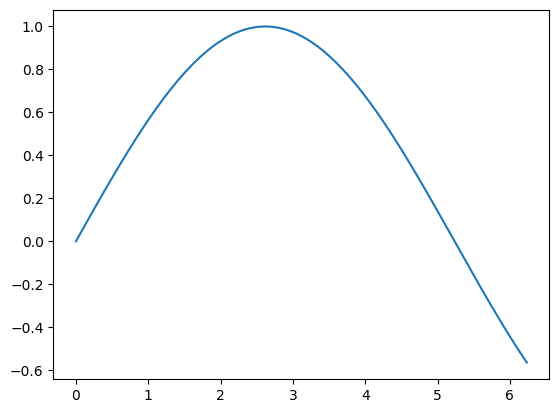

In [ ]:
whichCondition=7

if whichCondition == 0:
    #Single sine mode

    Amplitude = 1.0
    wavelength = 2.0

    initcondition = Amplitude*np.sin(wavelength*x)
    c0 = fft(initcondition)[:N+1]/len(initcondition) #it is the positive dft part as normalized and cut in half
    mask = np.where(abs(c0)<1e-14,0,1) #it is 0 when c0<.. and 1 ow
    #print(c0)
    #print(mask)
    c0 = c0*mask
    plt.plot(x,initcondition)
elif whichCondition == 1:
    #Multiple trigonometric functions

    Amplitudes = [2.0,0.2,-0.5,.01]
    wavelengths = [1.0,2.0,6.0,10.0]

    isSine = [0,1,0,1]

    Modes = [(A*np.cos(w*x),A*np.sin(w*x)) for A,w in zip(Amplitudes,wavelengths)]
    initcondition = [mode[i] for mode,i in zip(Modes,isSine)]

    initcondition = sum(initcondition,0)
    #initcondition_check=2*np.cos(x)+0.2*np.sin(2*x)-0.5*np.cos(6*x)+.01*np.sin(10*x) #initcondition is giving this
    c0 = fft(initcondition)[:N+1]/len(initcondition)
    mask = np.where(abs(c0)<1e-14,0,1)
    c0 = c0*mask
    #plt.plot(x,initcondition)
    #plt.plot(x,initcondition_check,'--')

elif whichCondition == 2:
    #Random initial condition where the k-th Fourier amplitude (k=/=0) is distributed like N(0,(sigma/4k^2)^2)
    #the phase is uniform in [0,2pi]
    TotalNoModes = 30
    if TotalNoModes >= N:
        raise Exception('No. of modes in initial condition is greater than no. of grid points. No initial condition returned.')

    sigma = 1.0

    Amplitudes = [np.random.randn(1)[0]*sigma/(2*k)**2 for k in np.r_[1:TotalNoModes]] #kth wave number amp has variance sigma/k*np.sqrt(2)
    #print(Amplitudes)
    phases = 2*pi*np.random.random_sample(TotalNoModes)[1:] #choosing phases uniformly in [0,2*np.pi]
    #print(phases)

    ZeroMode = np.random.randn(1)[0]

    #print(ZeroMode)

    c0 = np.array([A*np.exp(1j*p) for A,p in zip(Amplitudes,phases)]) #the dft of initial condition

    #print(c0)

    c0 = np.r_[ZeroMode,c0,np.zeros(N-TotalNoModes+1)]

    #print(c0)

    if len(c0)>N+1 or len(c0)<N+1:
        raise Exception('len(c0) must match N.')
    plt.scatter(np.r_[0:N+1],abs(c0))
    plt.yscale('log')
elif whichCondition == 3:
    #Cnoidal initial condition
    #Elliptic parameter. m=0 is a cosine function, m=1 is sech^2 profile
    m = 0.999
    kappa = special.ellipk(m)/pi
    initcondition = 12*m*kappa**2*special.ellipj(kappa*x,m)[1]**2 #elliptic cosine
    speed = 8*kappa**2*m - 4*kappa**2

    c0 = fft(initcondition)[:N+1]/len(initcondition)

    mask = np.where(abs(c0)<1e-14,0,1)
    c0 = c0*mask
    #semilogy(r_[0:N+1],abs(c0))
    plt.plot(x,initcondition)

elif whichCondition==4:
    #Single sine mode

    Amplitude = 1.0
    wavelength = 2.0

    initcondition = Amplitude*np.sin(wavelength*x/4)
    c0 = fft(initcondition)[:N+1]/len(initcondition) #it is the positive dft part as normalized and cut in half
    mask = np.where(abs(c0)<1e-14,0,1) #it is 0 when c0<.. and 1 ow
    #print(c0)
    #print(mask)
    c0 = c0*mask
    plt.plot(x,initcondition)

elif whichCondition==5:
    #Single sine mode

    Amplitude = -1.0
    wavelength = 0.5

    initcondition = Amplitude*np.sin(wavelength*x)
    c0 = fft(initcondition)[:N+1]/len(initcondition) #it is the positive dft part as normalized and cut in half
    mask = np.where(abs(c0)<1e-14,0,1) #it is 0 when c0<.. and 1 ow
    #print(c0)
    #print(mask)
    c0 = c0*mask
    plt.plot(x,initcondition)

elif whichCondition == 6:
    #Cnoidal initial condition
    #Elliptic parameter. m=0 is a cosine function, m=1 is sech^2 profile
    m = 0.999
    kappa = special.ellipk(m)/pi
    initcondition = 0.4*m*kappa**2*special.ellipj(kappa*x,m)[1]**2 #elliptic cosine
    speed = 8*kappa**2*m - 4*kappa**2

    c0 = fft(initcondition)[:N+1]/len(initcondition)

    mask = np.where(abs(c0)<1e-14,0,1)
    c0 = c0*mask
    #semilogy(r_[0:N+1],abs(c0))
    plt.plot(x,initcondition)

elif whichCondition==7:
    #Single sine mode

    Amplitude = 1.0
    wavelength = 0.6

    initcondition = Amplitude*np.sin(wavelength*x)
    c0 = fft(initcondition)[:N+1]/len(initcondition) #it is the positive dft part as normalized and cut in half
    mask = np.where(abs(c0)<1e-14,0,1) #it is 0 when c0<.. and 1 ow
    #print(c0)
    #print(mask)
    c0 = c0*mask
    plt.plot(x,initcondition)

#### Functions to define the vector field

Here we define two functions. One to compute the semi-group of the linear equation and another to compute the nonlinear term. The numerical method we employ integrates the linear term exactly.

In [ ]:
def SemiGroupOperators(dt,k):
    if len(k)%2 == 1:
        N = int((len(k)-1)/2)
    else:
        N = int(len(k)/2)

    k1 = k[:N+1]
    '''S = sparse.diags(np.exp(1j*k1**3*dt))  #The exponent comes from the dispersion relation for the linear problem
    S_half = sparse.diags(np.exp(1j*k1**3*dt/2))   #Same idea here; but for dt/2'''

    #for uxx

    S = sparse.diags(np.exp(-k1**2*dt))  #The exponent comes from the dispersion relation for the linear problem
    S_half = sparse.diags(np.exp(-k1**2*dt/2))   #Same idea here; but for dt/2

    return S_half, S

def Nonlinear(c,k,lamda):
    if len(k)%2 == 1:
        N = int((len(k)-1)/2)
    else:
        N = int(len(k)/2)

    k = k[:N+1]

    #Dealising: we're adding more zeros to the function so that we can compute the product u^2 without errors (ask me in class)
    if N%2==0:
        M = 3*int(N/2)
        d = np.r_[c*2*(N+M),np.zeros(M)] #padding with zeros and introducing a normalizing factor 2*(N+M)
        d = np.r_[d,np.conj(d[-2:0:-1])] #adding the negative part
        k = np.r_[k,np.zeros(M)] #padding k
        k = np.r_[k,-k[-2:0:-1]] #adding negative part
    else:
        M = 3*int((N+1)/2)
        d = np.r_[c*(2*(N+M)+1),np.zeros(M)]
        d = np.r_[d,np.conj(d[:0:-1])]
        k = np.r_[k,np.zeros(M)]
        k = np.r_[k,-k[:0:-1]]

    #Compute real-valued functions u, du/dx and their product
    u = ifft(d).real
    '''uprime = ifft(d*1j*k).real
    nonlinear = -u*uprime'''

    #for u*(1+lam*u*u)

    nonlinear=u+lam*u**3

    nonlinear = fft(nonlinear)[:N+1]/len(nonlinear)
    mask = np.where(abs(nonlinear)<1e-15,0,1) #this is imp,so that k**3 doesn't mess the thing up on high k due to rounding errors
    nonlinear = mask*nonlinear
    return nonlinear


#### Runge-Kutta scheme

The RK scheme is fourth order and assumes the equation is of the form $$ \frac{dy}{dt} = Ly + N(y)$$ To integrate this, we introduce a new variable $y = e^{Lt}v$ where $e^{Lt}$ is the semigroup associated with the linear operator $L$. This leads to an equivalent equation for $v$ for which we apply the usual RK4 scheme. Reverting to the original variable we obtain the RK scheme with exact integration of the linear term.

However, we now require expressions for $e^{L\:dt}$ and $e^{L\:dt/2}$.

In [ ]:
'''
This RK4 integrates an ODE starting from a time t0 and ending at tfinal using time-steps dt.

ODEs are assumed to be of the form y' = Ly + N(y)

The function RK4 also takes as input the following

SemiGroup   : The semi-group generated by L leads to S = exp(L dt) and S_half = exp(L dt/2). One can either
              supply these matrices directly as a tuple/list SemiGroup = [S_half,S]
              or a subroutine that gives these matrices as output when (t,dt) and
              any other parameters required are supplied to the function SemiGroup.
Nonlinear   : a function to compute the nonlinear term on right-hand side of a differential equation
              dy/dt = Ly + Nonlinear(y,args)
              Here args can be a list or tuple of arguments which are needed to define the nonlinear function.
              These could be parameters in the problem. Presently, Nonlinear does not vary in time.
y0          : an initial condition


The output of this function is two arrays.

Time : an array with times from t0 to tfinal in steps of dt
Solution  : an array consisting of the solution (a vector the same size as y0) at each time in Time

'''
def RK4_ExplicitLinear(SemiGroup,Nonlinear,y0,t0,tfinal,dt,args):

    y = y0

    t = t0
    Time = [t0,]
    Solution = [y,]
    flag = True

    if (type(SemiGroup)==type([1,2]) or type(SemiGroup)==type((1,2))):
        S_half, S = SemiGroup
    elif type(SemiGroup) == type(Nonlinear):
        S_half, S = SemiGroup(y,t,dt,*args)
    else:
        print('SemiGroup must be either a tuple/list of two numpy arrays or a function that returns\
              a list/tuple of two numpy arrays.')
        print('program terminating.')
        return None

    while flag==True:
        k1 = dt*Nonlinear(y,*args)

        temp = y + k1/2.0
        temp = S_half.dot(temp)

        k2 = dt*Nonlinear(temp,*args)

        temp = S_half.dot(y) + k2/2.0

        k3 = dt*Nonlinear(temp,*args)

        temp = S.dot(y)
        temp = temp + S_half.dot(k3)

        k4 = dt*Nonlinear(temp,*args)

        temp1 = k4

        temp2 = S_half.dot(k3)*2
        temp1 = temp1 + temp2

        temp2 = S_half.dot(k2)*2
        temp1 = temp1 + temp2

        temp2 = S.dot(k1)
        temp1 = temp1 + temp2

        temp = S.dot(y)

        y = temp + temp1/6.0

        Solution.append(y)

        t = t + dt
        Time.append(t)

        if abs(t-tfinal)<dt/10:
            flag = False
        elif any(np.isnan(y)):
            flag = False

    Time = np.array(Time)
    Solution = np.array(Solution)
    return Time,Solution

#### Setting the temporal resolution

Set the parameter $dt$ and final time $T$. Finally compute the necessary semi-groups.

In [ ]:
t0 = 0.0
tfinal = 5.0
dt = .0001
lam=1

S_half, S = SemiGroupOperators(dt,k)
args = (k,lam)

In [ ]:
#condition 7,lamda=1

time_7,solution_7 = RK4_ExplicitLinear([S_half,S],Nonlinear,c0,t0,tfinal,dt,args)

time=time_7

solution=solution_7

<ipython-input-73-2e252ee424f4>:47: RuntimeWarning: overflow encountered in power
  nonlinear=u+lam*u**3


In [ ]:
#condition 7,lamda=1

#blow up time

len(time)


4137

In [ ]:
#condition 6,lamda=1

time_6,solution_6 = RK4_ExplicitLinear([S_half,S],Nonlinear,c0,t0,tfinal,dt,args)

time=time_6

solution=solution_6



<ipython-input-64-2e252ee424f4>:47: RuntimeWarning: overflow encountered in power
  nonlinear=u+lam*u**3


In [ ]:
#condition 6,lamda=1

#blow up time step

len(time)

#blown up at time 1.0739

10739

In [ ]:
#condition 5,lamda=1

time_5,solution_5 = RK4_ExplicitLinear([S_half,S],Nonlinear,c0,t0,tfinal,dt,args)

time=time_5

solution=solution_5


<ipython-input-54-2e252ee424f4>:47: RuntimeWarning: overflow encountered in power
  nonlinear=u+lam*u**3


In [ ]:
#condition 5,lamda=1

#blow up time step

len(time)

3917

#### Compute the solution

In [ ]:
#condition 4,lamda=1

time_4,solution_4 = RK4_ExplicitLinear([S_half,S],Nonlinear,c0,t0,tfinal,dt,args)

time=time_4

solution=solution_4

#overflow for sin(2x/4) initial condition,lam=1(only positive)

<ipython-input-39-2e252ee424f4>:47: RuntimeWarning: overflow encountered in power
  nonlinear=u+lam*u**3


In [ ]:
#condition 4,lamda=1

#blow up time step

len(time)

#so blown up at time 0.3917 for sin(2x/4) initial condition,lam=1(only positive)

3917

In [ ]:
time,solution = RK4_ExplicitLinear([S_half,S],Nonlinear,c0,t0,tfinal,dt,args)

#### Plot the solution

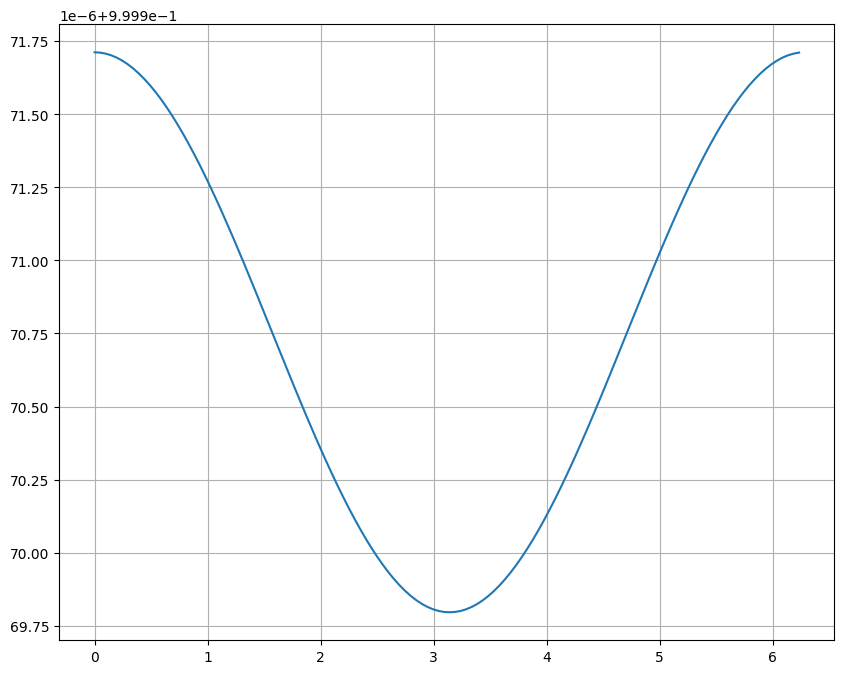

In [ ]:
#condition 3,lamda=-1

plt.figure(figsize=(10,8))
tval = -100

if len(x)%2==0:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][-2:0:-1])]
else:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][:0:-1])]
phys_solution = ifft(phys_solution*len(phys_solution)).real
plt.plot(x,phys_solution)
plt.grid()

#condition-3,lamda=-1
#decay is there

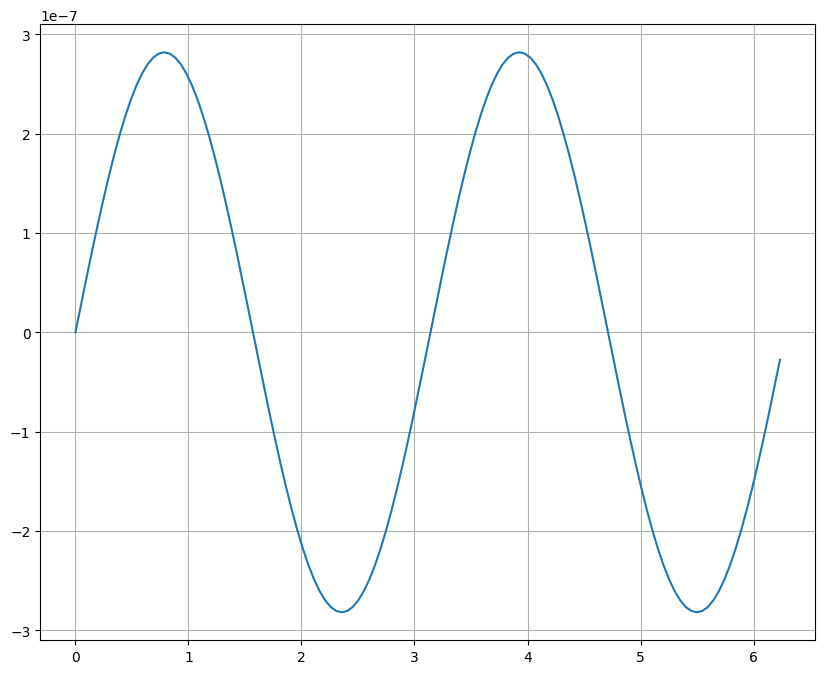

In [ ]:
#condition 0,lamda=-1

plt.figure(figsize=(10,8))
tval = -100

if len(x)%2==0:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][-2:0:-1])]
else:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][:0:-1])]
phys_solution = ifft(phys_solution*len(phys_solution)).real
plt.plot(x,phys_solution)
plt.grid()

#condition-0 sine wave -amplitude -1,frequency-2,lamda=-1
#lot of decay

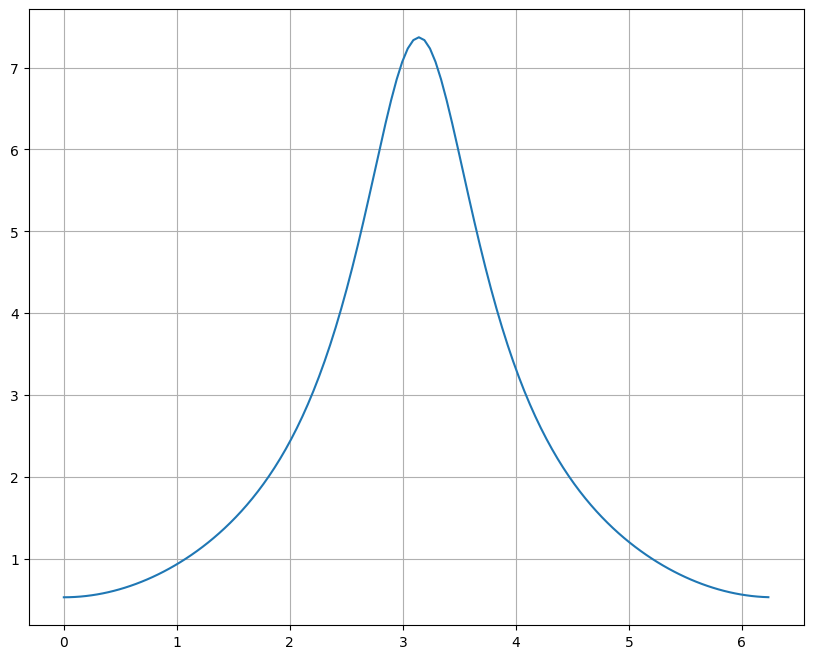

In [ ]:
#condition 4,lamda=1

plt.figure(figsize=(10,8))
tval = -100

if len(x)%2==0:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][-2:0:-1])]
else:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][:0:-1])]
phys_solution = ifft(phys_solution*len(phys_solution)).real
plt.plot(x,phys_solution)
plt.grid()

# sine wave -amplitude -1,frequency-0.5,lamda=1
#solution grown

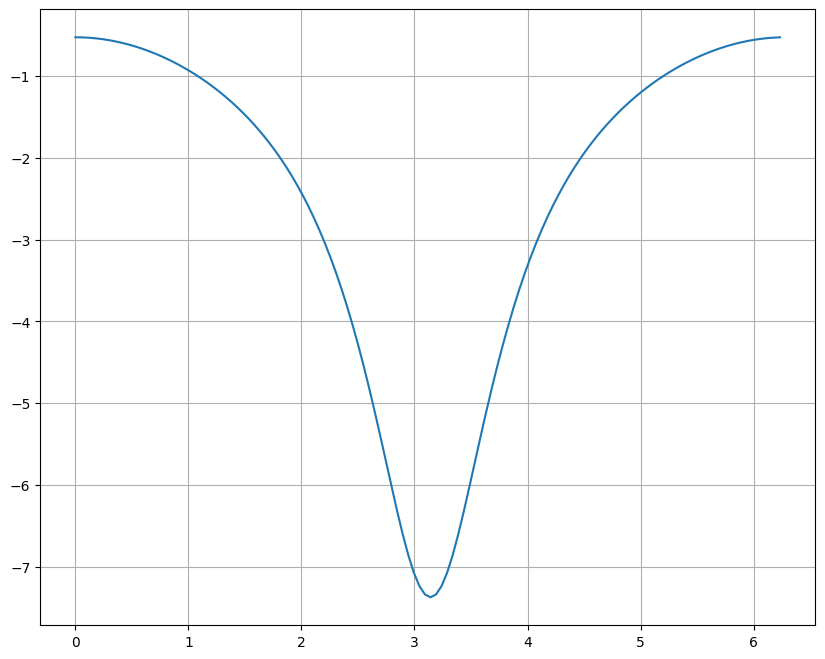

In [ ]:
#condition 5,lamda=1

plt.figure(figsize=(10,8))
tval = -100

if len(x)%2==0:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][-2:0:-1])]
else:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][:0:-1])]
phys_solution = ifft(phys_solution*len(phys_solution)).real
plt.plot(x,phys_solution)
plt.grid()

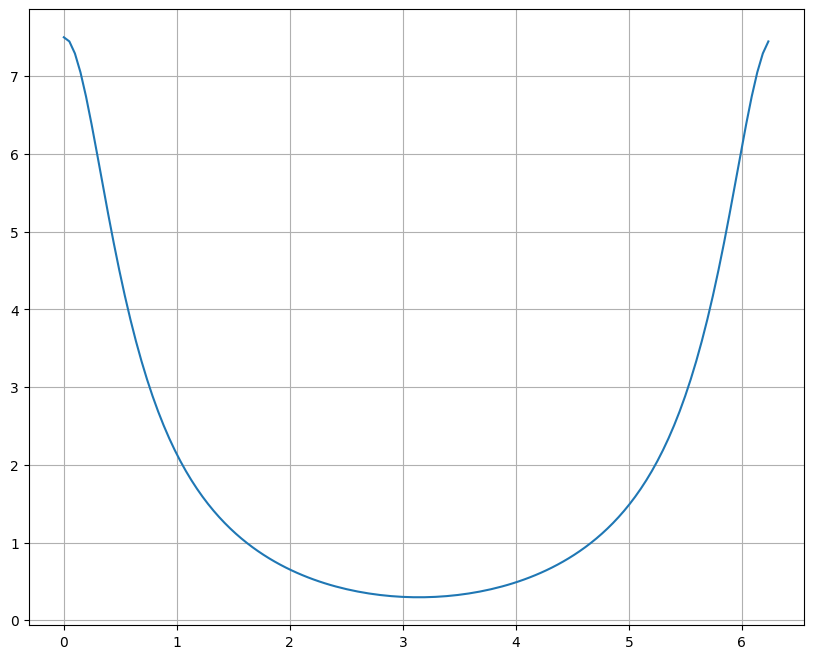

In [ ]:
#condition 6,lamda=1

plt.figure(figsize=(10,8))
tval = -100

if len(x)%2==0:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][-2:0:-1])]
else:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][:0:-1])]
phys_solution = ifft(phys_solution*len(phys_solution)).real
plt.plot(x,phys_solution)
plt.grid()

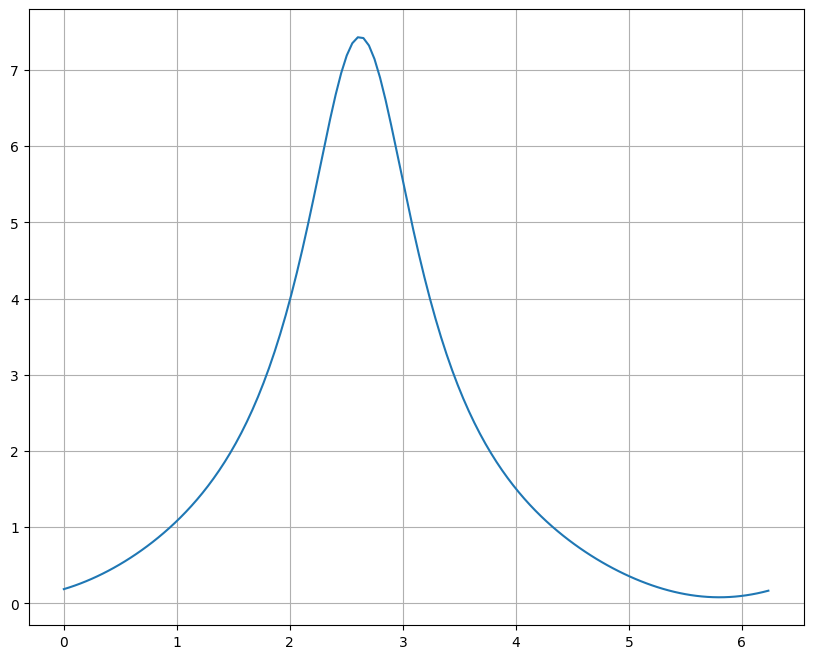

In [ ]:
#condition 7,lamda=1

plt.figure(figsize=(10,8))
tval = -100

if len(x)%2==0:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][-2:0:-1])]
else:
    phys_solution = np.r_[solution[tval],np.conj(solution[tval][:0:-1])]
phys_solution = ifft(phys_solution*len(phys_solution)).real
plt.plot(x,phys_solution)
plt.grid()

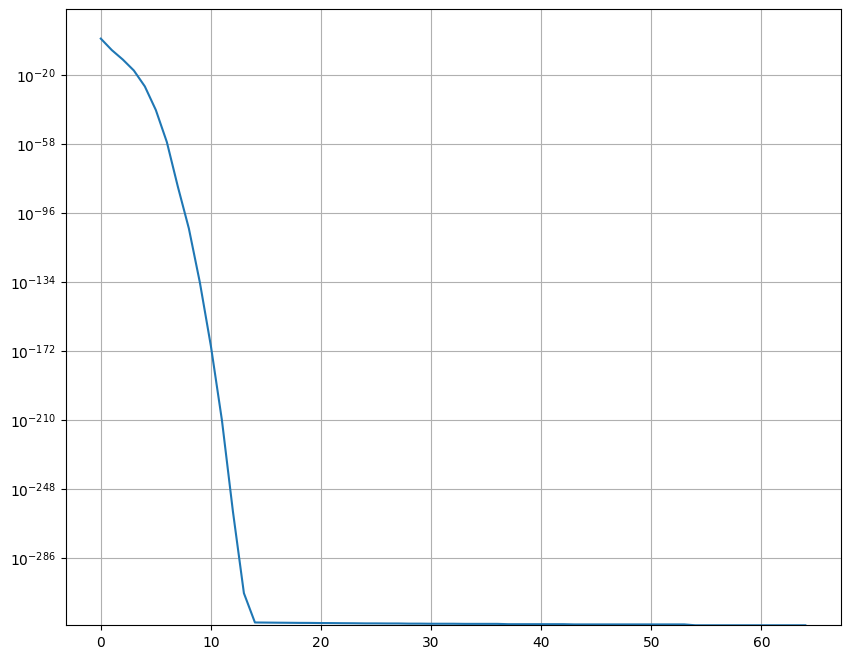

In [ ]:
#condition 3,lamda=-1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-1])[0:N+1])
plt.grid()

#condition-3,lamda=-1
#good decay

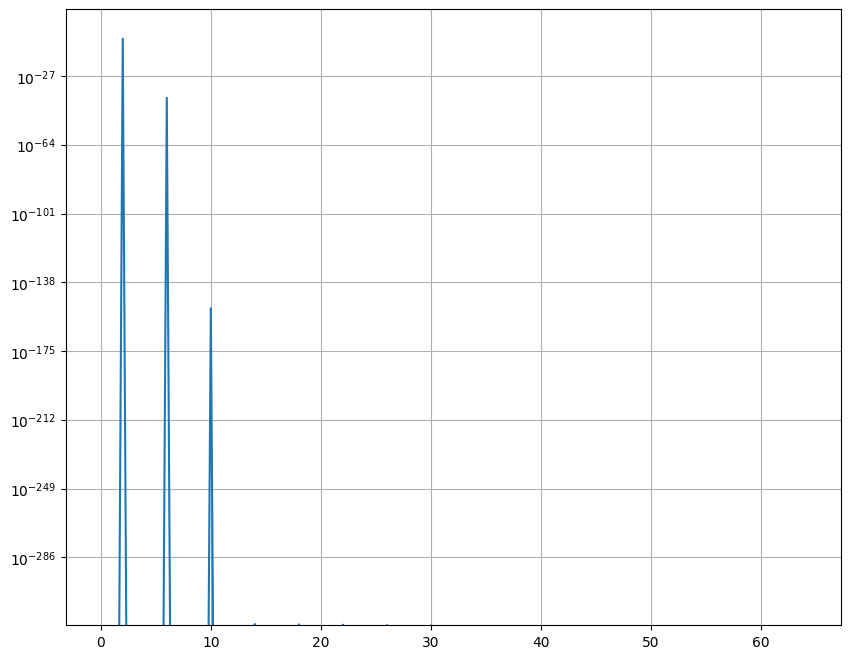

In [ ]:
#condition 0,lamda=-1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-1])[0:N+1])
plt.grid()

#condition-0 sine wave -amplitude -1,frequency-2,lamda=-1
#expected for sine mode

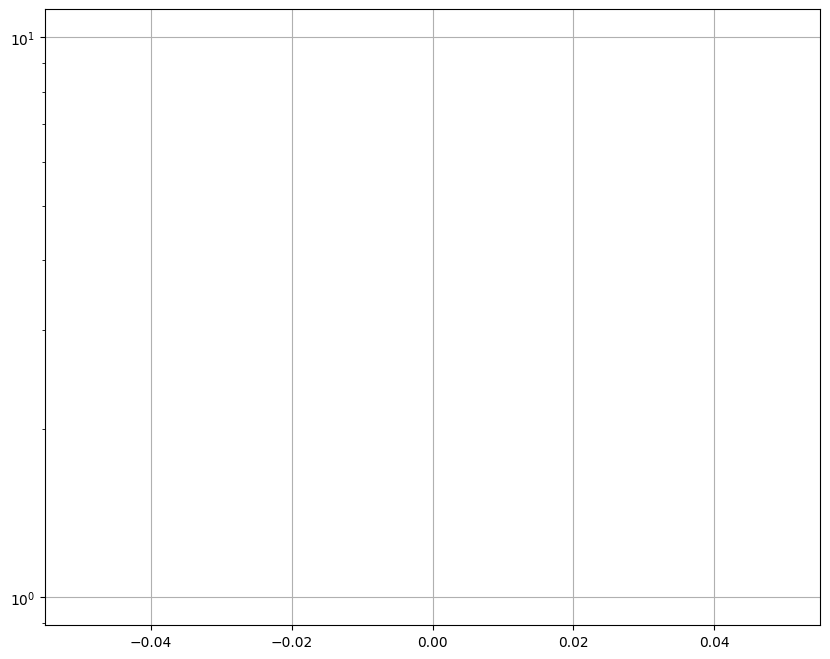

In [ ]:
#condition 4,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-1])[0:N+1])
plt.grid()

#sine wave -amplitude -1,frequency-0.5,lamda=1
#last time it gives up

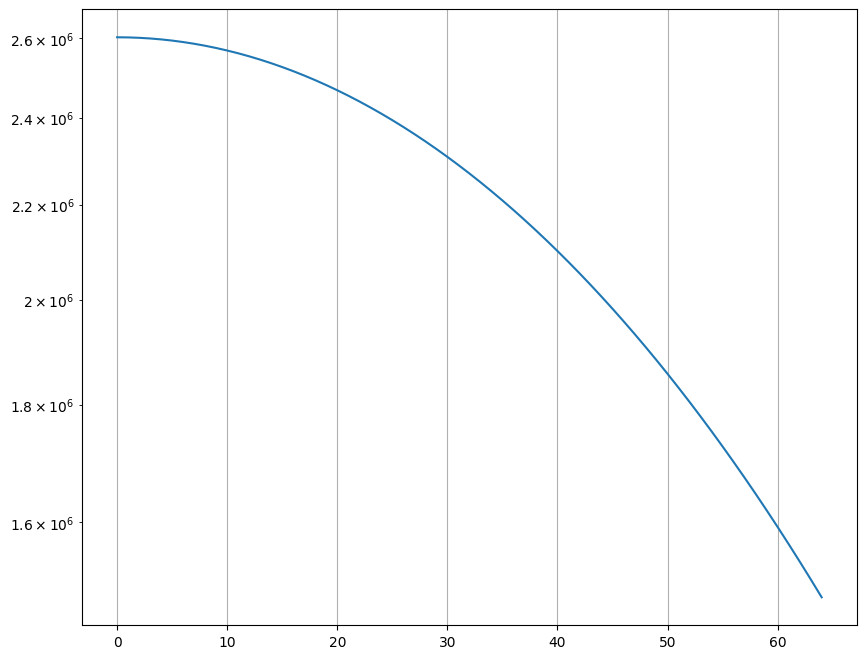

In [ ]:
#condition 4,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-2])[0:N+1])
plt.grid()

#sine wave -amplitude -1,frequency-0.5,lamda=1
#second last time is fine

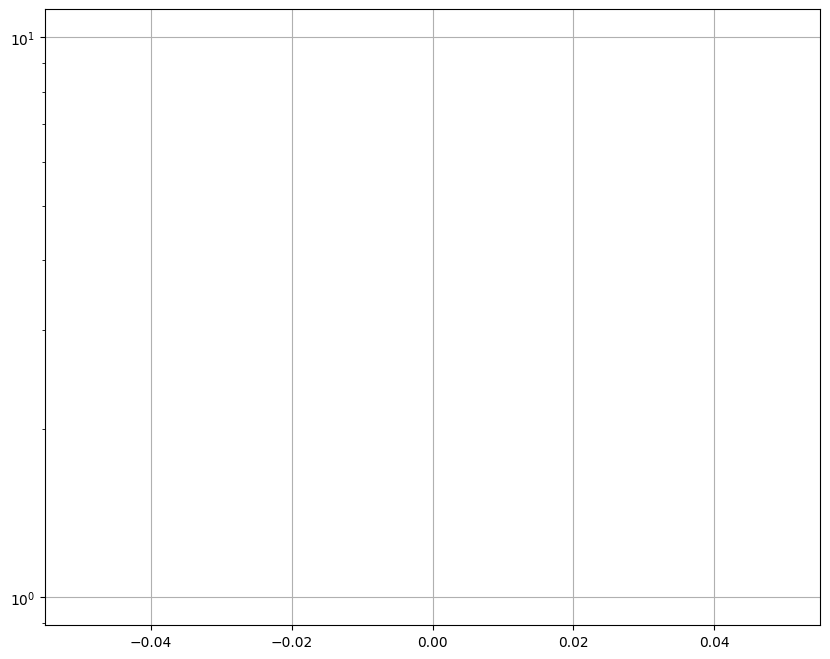

In [ ]:
#condition 5,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-1])[0:N+1])
plt.grid()

#last time

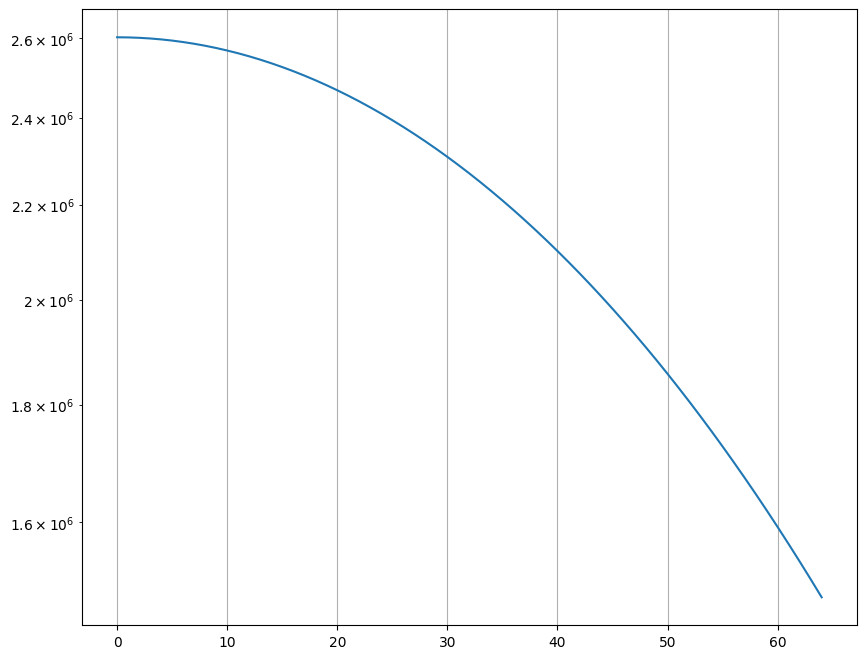

In [ ]:
#condition 5,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-2])[0:N+1])
plt.grid()

#second last time

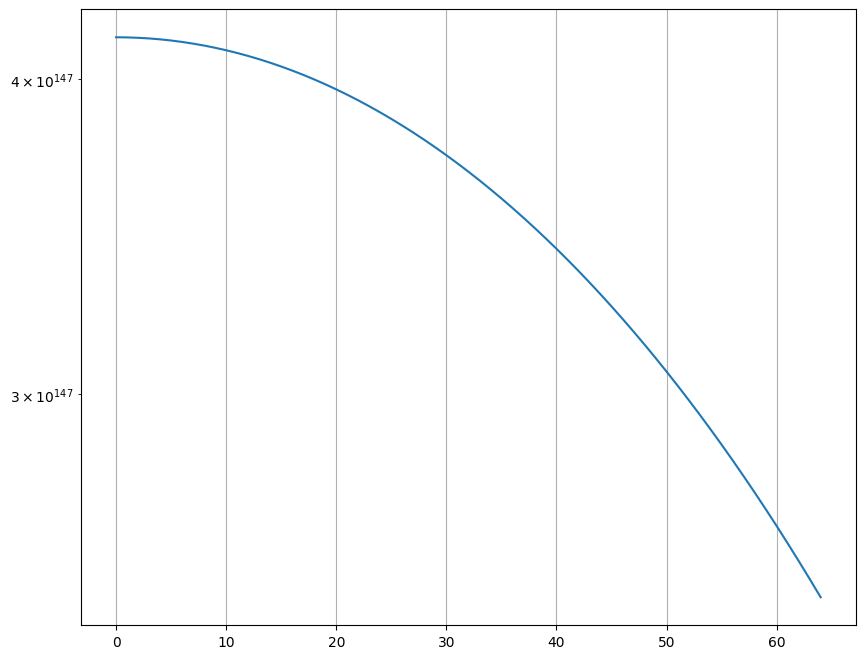

In [ ]:
#condition 6,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-2])[0:N+1])
plt.grid()

#second last time

#large fourier modes

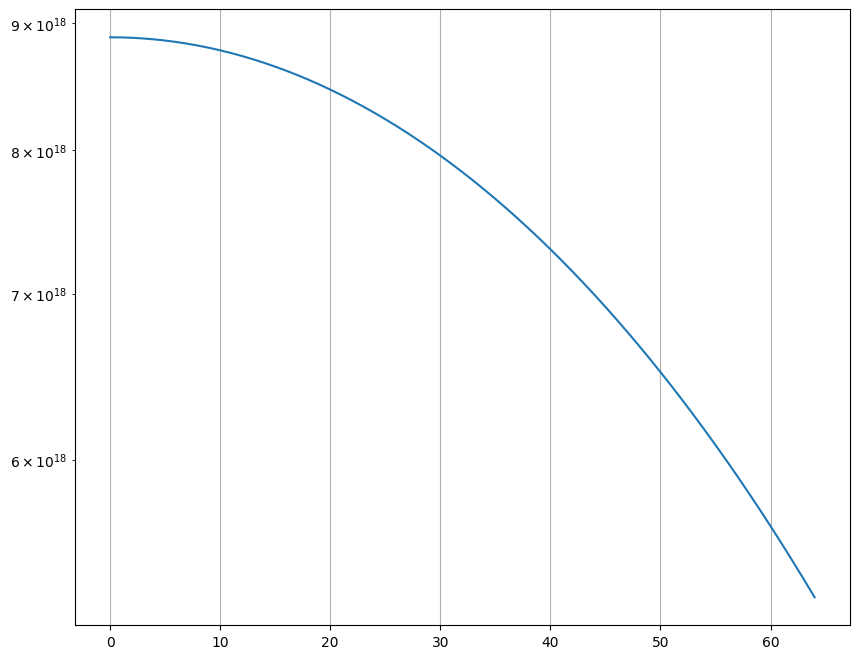

In [ ]:
#condition 7,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(np.r_[0:N+1],np.abs(solution[-2])[0:N+1])
plt.grid()

#second last time

#large fourier modes

#### Conserved quantities

In [ ]:
momentum = []
hamiltonian = []
F = []
L1 = []
L2 = []
DL2 = []

for tt in range(len(time)):
    Sol = solution[tt]

    p = np.real(Sol[0] + Sol[1:]*np.conj(Sol[1:])*2)
    momentum.append(sum(p))

    if len(x)%2==0:
        PhysSol = np.r_[Sol,np.conj(Sol[-2:0:-1])]
        PhysSol = ifft(PhysSol*len(PhysSol)).real
        Sol = Sol*np.r_[0:N+1]*1j
        PhysSolPrime = np.r_[Sol,np.conj(Sol[-2:0:-1])]
        PhysSolPrime = ifft(PhysSolPrime*len(PhysSolPrime)).real
        Sol = Sol*np.r_[0:N+1]*1j
        PhysSolPrime2 = np.r_[Sol,np.conj(Sol[-2:0:-1])]
        PhysSolPrime2 = ifft(PhysSolPrime2*len(PhysSolPrime2)).real
    else:
        PhysSol = np.r_[Sol,np.conj(Sol[:0:-1])]
        PhysSol = ifft(PhysSol*len(PhysSol)).real
        Sol = Sol*np.r_[0:N+1]*1j
        PhysSolPrime = np.r_[Sol,np.conj(Sol[:0:-1])]
        PhysSolPrime = ifft(PhysSolPrime*len(PhysSolPrime)).real
        Sol = Sol*np.r_[0:N+1]*1j
        PhysSolPrime2 = np.r_[Sol,np.conj(Sol[:0:-1])]
        PhysSolPrime2 = ifft(PhysSolPrime2*len(PhysSolPrime2)).real

    h = fft(PhysSolPrime**2/2.0-PhysSol**3/6.0)[0]/len(PhysSol)
    hamiltonian.append(np.real(h))

    f = fft(PhysSol**4/24.0-PhysSol*PhysSolPrime**2/2.0+PhysSolPrime2**2/10.0*3)[0]/len(PhysSol)
    F.append(np.real(f))

    L1.append(np.linalg.norm(PhysSol, ord=1))
    L2.append(np.linalg.norm(PhysSol, ord=2))
    DL2.append(np.linalg.norm(PhysSolPrime, ord=2))

momentum = np.array(momentum)
hamiltonian = np.array(hamiltonian)
F = np.array(F)

L1 = np.array(L1)
L2 = np.array(L2)
DL2 = np.array(DL2)

Text(0.5, 0, 'Time')

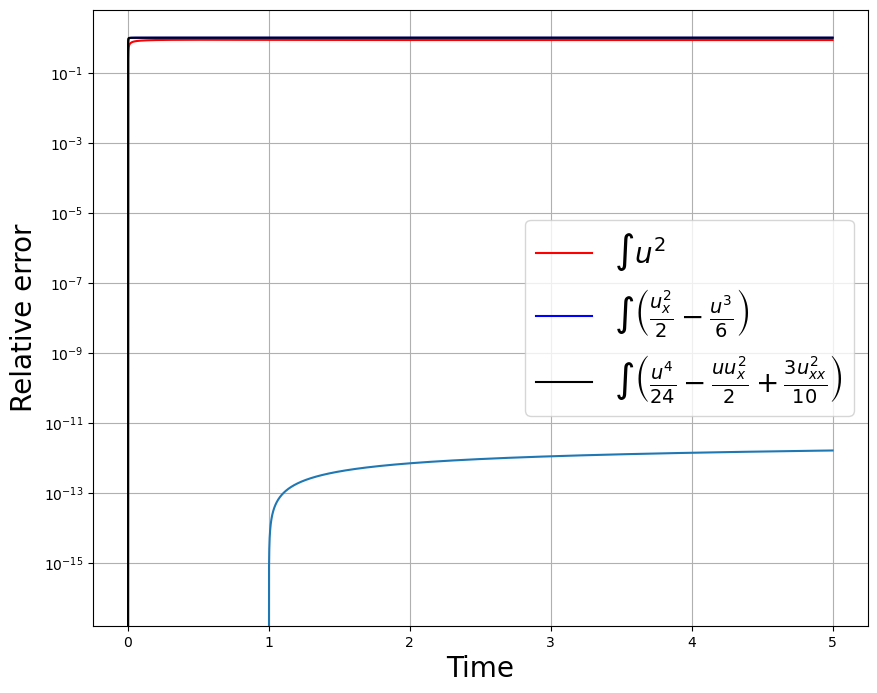

In [ ]:
#condition 3,lamda=-1

plt.figure(figsize=(10,8))
plt.semilogy(time,abs(momentum-momentum[0])/abs(momentum[0]),'r')
plt.semilogy(time,abs(hamiltonian-hamiltonian[0])/abs(hamiltonian[0]),'b')
plt.semilogy(time,abs(F-F[0])/abs(F[0]),'k')
plt.semilogy(time[1:],np.log(time[1:])*dt**3)
plt.grid()
#plt.axis([0,time[-1],1e-15,1e-10])
plt.legend([r'$\int u^2$',r'$\int \left(\frac{u_x^2}{2}-\frac{u^3}{6}\right)$',\
        r'$\int\left( \frac{u^4}{24} - \frac{uu_x^2}{2} + \frac{3u_{xx}^2}{10}\right)$'],fontsize=20)
plt.ylabel(r'Relative error',fontsize=20)
plt.xlabel(r'Time',fontsize=20)

#condition-3,lamda=-1
#conserved

Text(0.5, 0, 'Time')

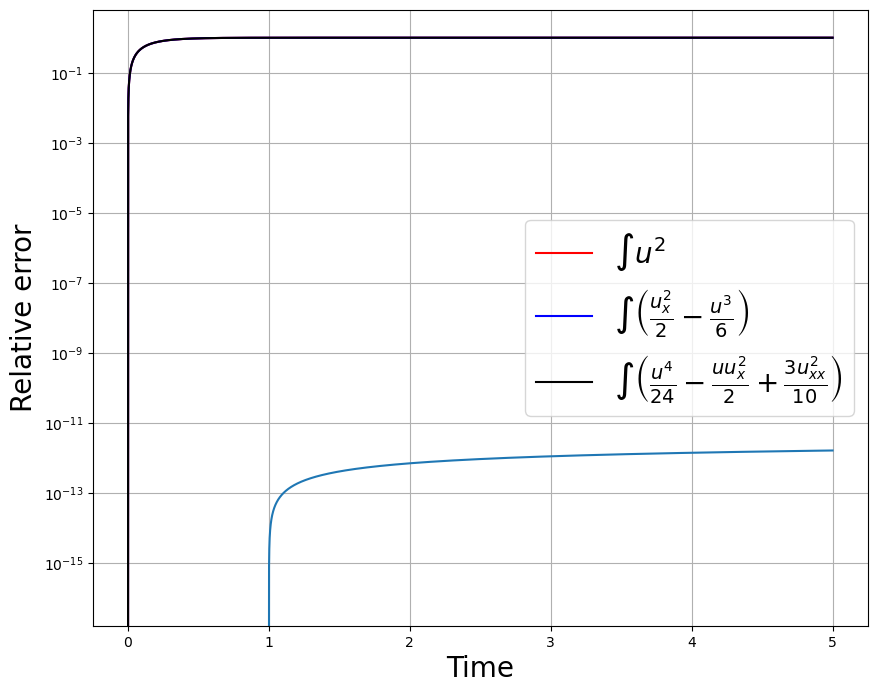

In [ ]:
#condtion 0,lamda=-1

plt.figure(figsize=(10,8))
plt.semilogy(time,abs(momentum-momentum[0])/abs(momentum[0]),'r')
plt.semilogy(time,abs(hamiltonian-hamiltonian[0])/abs(hamiltonian[0]),'b')
plt.semilogy(time,abs(F-F[0])/abs(F[0]),'k')
plt.semilogy(time[1:],np.log(time[1:])*dt**3)
plt.grid()
#plt.axis([0,time[-1],1e-15,1e-10])
plt.legend([r'$\int u^2$',r'$\int \left(\frac{u_x^2}{2}-\frac{u^3}{6}\right)$',\
        r'$\int\left( \frac{u^4}{24} - \frac{uu_x^2}{2} + \frac{3u_{xx}^2}{10}\right)$'],fontsize=20)
plt.ylabel(r'Relative error',fontsize=20)
plt.xlabel(r'Time',fontsize=20)

#condition-0 sine wave -amplitude -1,frequency-2,lamda=-1
#conserved

Text(0.5, 0, 'Time')

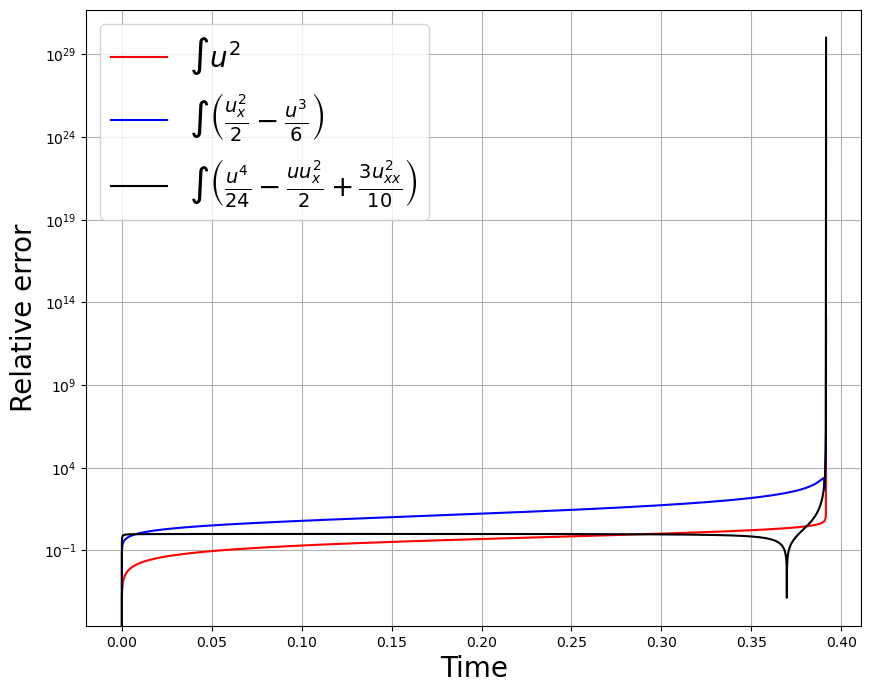

In [ ]:
#condition 4,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(time,abs(momentum-momentum[0])/abs(momentum[0]),'r')
plt.semilogy(time,abs(hamiltonian-hamiltonian[0])/abs(hamiltonian[0]),'b')
plt.semilogy(time,abs(F-F[0])/abs(F[0]),'k')
plt.semilogy(time[1:],np.log(time[1:])*dt**3)
plt.grid()
#plt.axis([0,time[-1],1e-15,1e-10])
plt.legend([r'$\int u^2$',r'$\int \left(\frac{u_x^2}{2}-\frac{u^3}{6}\right)$',\
        r'$\int\left( \frac{u^4}{24} - \frac{uu_x^2}{2} + \frac{3u_{xx}^2}{10}\right)$'],fontsize=20)
plt.ylabel(r'Relative error',fontsize=20)
plt.xlabel(r'Time',fontsize=20)

#sine wave -amplitude -1,frequency-0.5,lamda=1
#norms are not conserved

Text(0.5, 0, 'Time')

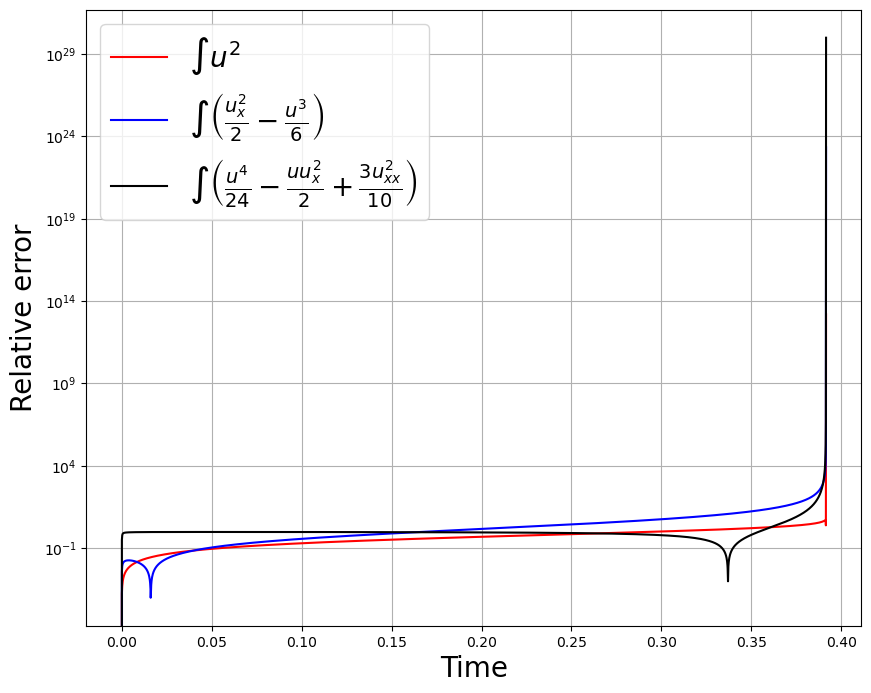

In [ ]:
#condition 5,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(time,abs(momentum-momentum[0])/abs(momentum[0]),'r')
plt.semilogy(time,abs(hamiltonian-hamiltonian[0])/abs(hamiltonian[0]),'b')
plt.semilogy(time,abs(F-F[0])/abs(F[0]),'k')
plt.semilogy(time[1:],np.log(time[1:])*dt**3)
plt.grid()
#plt.axis([0,time[-1],1e-15,1e-10])
plt.legend([r'$\int u^2$',r'$\int \left(\frac{u_x^2}{2}-\frac{u^3}{6}\right)$',\
        r'$\int\left( \frac{u^4}{24} - \frac{uu_x^2}{2} + \frac{3u_{xx}^2}{10}\right)$'],fontsize=20)
plt.ylabel(r'Relative error',fontsize=20)
plt.xlabel(r'Time',fontsize=20)

#again not conserved

Text(0.5, 0, 'Time')

/localhome/souryajit/anaconda3/lib/python3.11/site-packages/matplotlib/scale.py:253: RuntimeWarning: overflow encountered in power
  return np.power(self.base, a)


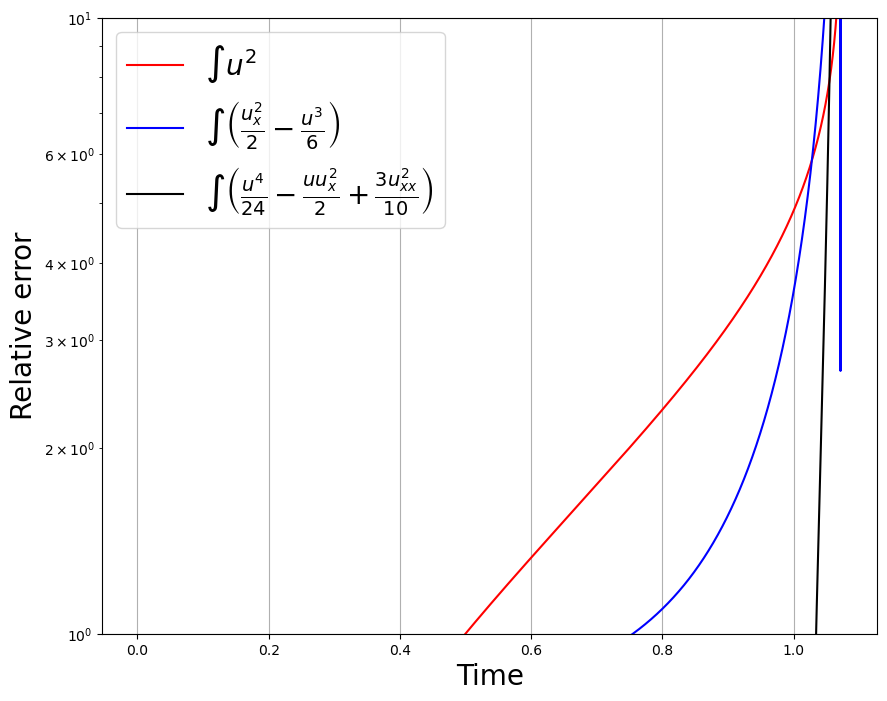

In [ ]:
#condition 6,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(time,abs(momentum-momentum[0])/abs(momentum[0]),'r')
plt.semilogy(time,abs(hamiltonian-hamiltonian[0])/abs(hamiltonian[0]),'b')
plt.semilogy(time,abs(F-F[0])/abs(F[0]),'k')
plt.semilogy(time[1:],np.log(time[1:])*dt**3)
plt.grid()
#plt.axis([0,time[-1],1e-15,1e-10])
plt.legend([r'$\int u^2$',r'$\int \left(\frac{u_x^2}{2}-\frac{u^3}{6}\right)$',\
        r'$\int\left( \frac{u^4}{24} - \frac{uu_x^2}{2} + \frac{3u_{xx}^2}{10}\right)$'],fontsize=20)
plt.ylabel(r'Relative error',fontsize=20)
plt.xlabel(r'Time',fontsize=20)

#again not conserved

#insane increase!

Text(0.5, 0, 'Time')

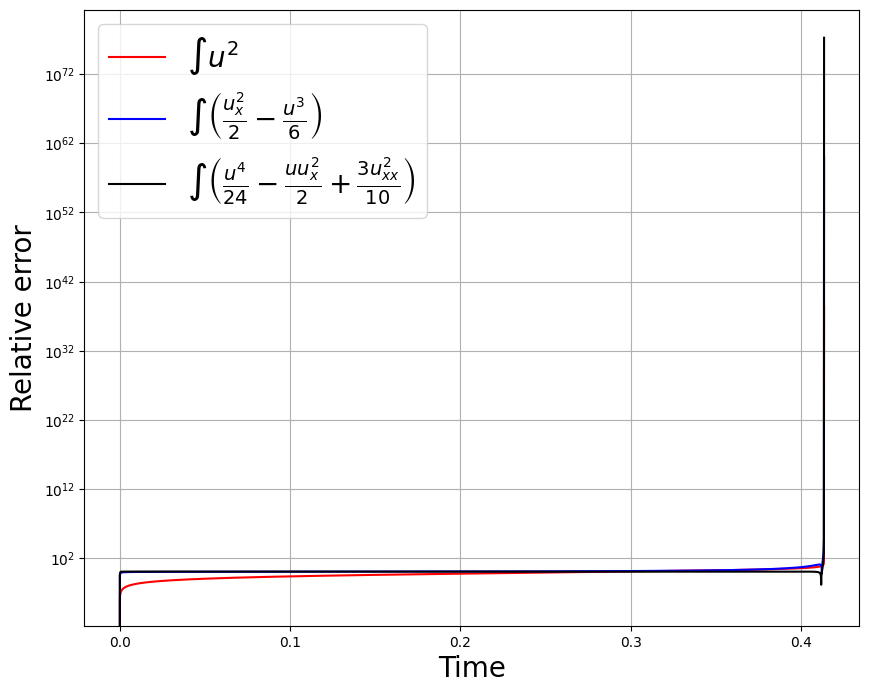

In [ ]:
#condition 7,lamda=1

plt.figure(figsize=(10,8))
plt.semilogy(time,abs(momentum-momentum[0])/abs(momentum[0]),'r')
plt.semilogy(time,abs(hamiltonian-hamiltonian[0])/abs(hamiltonian[0]),'b')
plt.semilogy(time,abs(F-F[0])/abs(F[0]),'k')
plt.semilogy(time[1:],np.log(time[1:])*dt**3)
plt.grid()
#plt.axis([0,time[-1],1e-15,1e-10])
plt.legend([r'$\int u^2$',r'$\int \left(\frac{u_x^2}{2}-\frac{u^3}{6}\right)$',\
        r'$\int\left( \frac{u^4}{24} - \frac{uu_x^2}{2} + \frac{3u_{xx}^2}{10}\right)$'],fontsize=20)
plt.ylabel(r'Relative error',fontsize=20)
plt.xlabel(r'Time',fontsize=20)

#again not conserved

#insane increase!

In [ ]:
#I was supposed to plot norms,I plotted the wrong thing instead :(

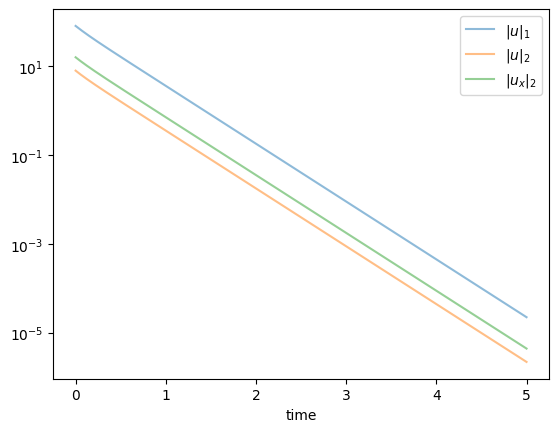

In [ ]:
#condition 0,lambda=-1

plt.semilogy(time, L1, alpha=0.5, label="$|u|_1$")
plt.semilogy(time, L2, alpha=0.5, label="$|u|_2$")
plt.semilogy(time, DL2,alpha=0.5, label="$|u_x|_2$")
plt.xlabel("time")
plt.legend()

#good decrease

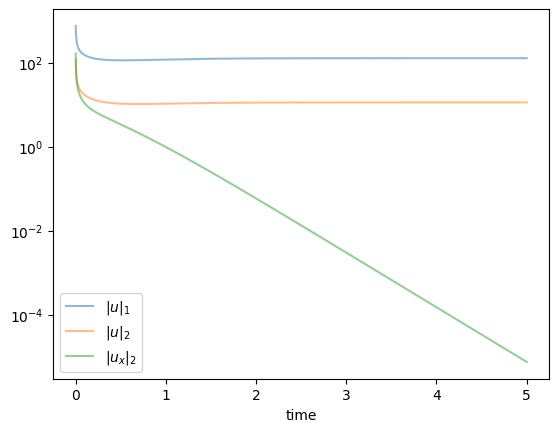

In [ ]:
#condition 3,lambda=-1

plt.semilogy(time, L1, alpha=0.5, label="$|u|_1$")
plt.semilogy(time, L2, alpha=0.5, label="$|u|_2$")
plt.semilogy(time, DL2,alpha=0.5, label="$|u_x|_2$")
plt.xlabel("time")
plt.legend()


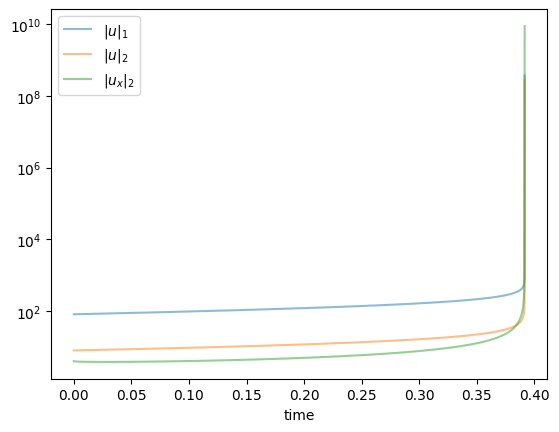

In [ ]:
#condition 4,lambda=1

plt.semilogy(time, L1, alpha=0.5, label="$|u|_1$")
plt.semilogy(time, L2, alpha=0.5, label="$|u|_2$")
plt.semilogy(time, DL2,alpha=0.5, label="$|u_x|_2$")
plt.xlabel("time")
plt.legend()

#we have increase/blow up

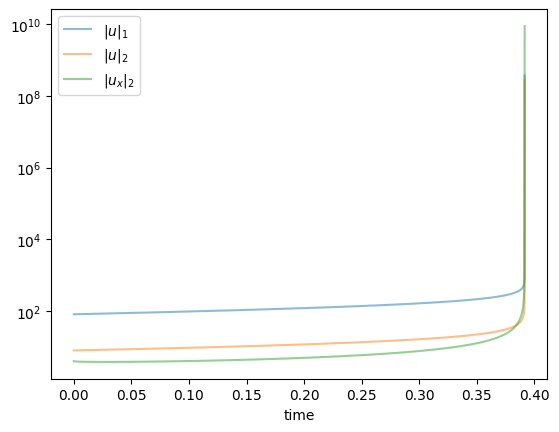

In [ ]:
#condition 5,lambda=1

plt.semilogy(time, L1, alpha=0.5, label="$|u|_1$")
plt.semilogy(time, L2, alpha=0.5, label="$|u|_2$")
plt.semilogy(time, DL2,alpha=0.5, label="$|u_x|_2$")
plt.xlabel("time")
plt.legend()

#we have increase/blow up

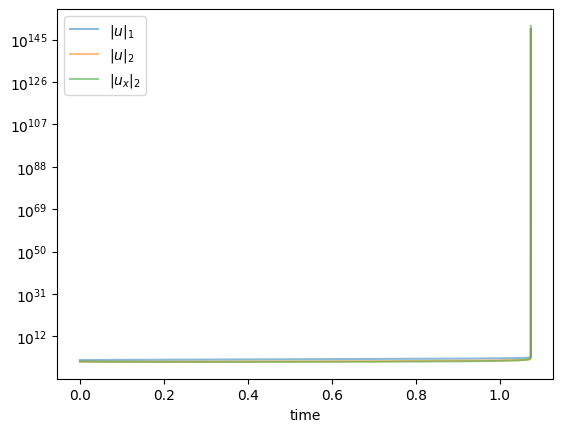

In [ ]:
#condition 6,lambda=1

plt.semilogy(time, L1, alpha=0.5, label="$|u|_1$")
plt.semilogy(time, L2, alpha=0.5, label="$|u|_2$")
plt.semilogy(time, DL2,alpha=0.5, label="$|u_x|_2$")
plt.xlabel("time")
plt.legend()

#we have increase/blow up

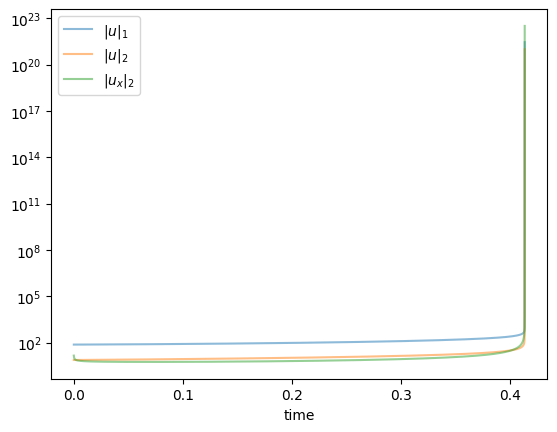

In [ ]:
#condition 7,lambda=1

plt.semilogy(time, L1, alpha=0.5, label="$|u|_1$")
plt.semilogy(time, L2, alpha=0.5, label="$|u|_2$")
plt.semilogy(time, DL2,alpha=0.5, label="$|u_x|_2$")
plt.xlabel("time")
plt.legend()

#we have increase/blow up

#### Animation of the solution

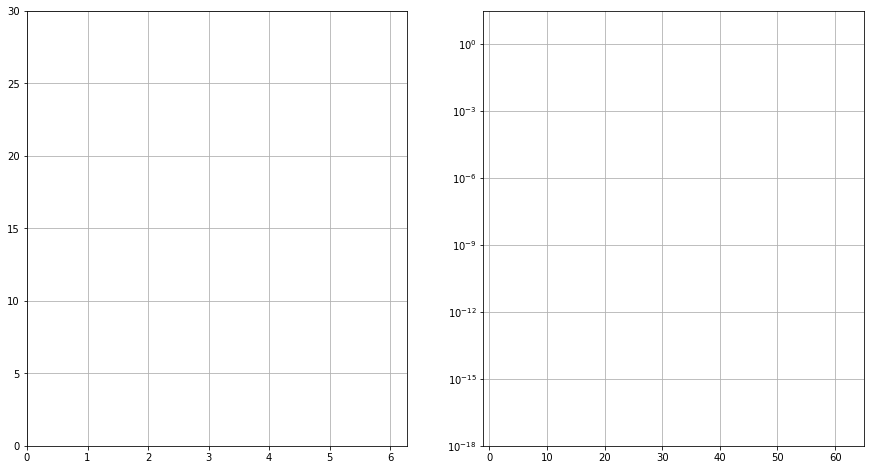

In [ ]:
# First set up the figure, the axis, and the plot element we want to animate
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,8));
ax1.grid();
ax2.grid();
ax1.set_xlim((0, 2*pi));
ax1.set_ylim(( 0, 30));

ax2.set_xlim(( -1, N+1));
ax2.set_ylim((1e-18, 30));

u, = ax1.plot([],[],'k');
c, = ax2.semilogy([],[],'k');

# initialization function: plot the background of each frame
def init():
    if len(x)%2==0:
        phys_solution = np.r_[solution[0],np.conj(solution[0][-2:0:-1])]
    else:
        phys_solution = np.r_[solution[0],np.conj(solution[0][:0:-1])]
    phys_solution = ifft(phys_solution*len(phys_solution)).real

    u.set_data(x,phys_solution)
    c.set_data(np.r_[0:N+1],np.abs(solution[0]))
    return (u,c)

# animation function. This is called sequentially
def animate(i):
    if len(x)%2==0:
        phys_solution = np.r_[solution[i],np.conj(solution[i][-2:0:-1])]
    else:
        phys_solution = np.r_[solution[i],np.conj(solution[i][:0:-1])]
    phys_solution = ifft(phys_solution*len(phys_solution)).real

    u.set_ydata(phys_solution)
    c.set_ydata(np.abs(solution[i]))
    return (u,c)

In [ ]:
# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,frames=np.r_[1:int(tfinal/dt):200], interval=200, blit=True)

In [ ]:
HTML(anim.to_jshtml())

In [ ]:
np.random.randn(1)

array([0.05723025])

In [ ]:
np.r_[0:5]

array([0, 1, 2, 3, 4])